# Satelliteguard

![Vodnjan Logo](assets/vodnjan-logo.png)

## Plot legalnih objekata i površina

In [22]:
import os
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load coordinates, legal objects, and surfaces data
with open("coordinates.json", "r") as f:
    coords_dict = json.load(f)

with open("legalni_objekti.json", "r") as f:
    legal_objects = json.load(f)

with open("povrsine.json", "r") as f:
    povrsine = json.load(f)

def plot_objects_and_agr_area(image_name):
    image_path = os.path.join("sample_images", image_name)

    top_left = coords_dict[image_name]["top-left"]
    bottom_right = coords_dict[image_name]["bottom-right"]

    Tx, Ty = top_left
    Bx, By = bottom_right

    # Open the image
    pil_img = Image.open(image_path)
    img_width, img_height = pil_img.size

    # Convert to a NumPy BGR image for OpenCV drawing
    image_bgr = cv2.cvtColor(np.array(pil_img), cv2.COLOR_RGB2BGR)

    # Counters for objects not on the image
    objects_not_on_image = 0
    surfaces_not_on_image = 0

    # Plot legal objects
    for obj in legal_objects:
        x_map = obj["x_coord"]
        y_map = obj["y_coord"]

        if Tx <= x_map <= Bx and By <= y_map <= Ty:
            x_pix = ((x_map - Tx) / (Bx - Tx)) * img_width
            y_pix = ((Ty - y_map) / (Ty - By)) * img_height

            cv2.circle(
                image_bgr,
                (int(x_pix), int(y_pix)),
                radius=5,
                color=(0, 255, 0),  # Green for legal objects
                thickness=-1
            )
        else:
            # print(f"Warning: Legal object at ({x_map}, {y_map}) is not in the image {image_name}")
            objects_not_on_image += 1

    # Plot surfaces
    for povrsina in povrsine:
        x_map = povrsina["x_coord"]
        y_map = povrsina["y_coord"]

        if Tx <= x_map <= Bx and By <= y_map <= Ty:
            x_pix = ((x_map - Tx) / (Bx - Tx)) * img_width
            y_pix = ((Ty - y_map) / (Ty - By)) * img_height

            cv2.circle(
                image_bgr,
                (int(x_pix), int(y_pix)),
                radius=5,
                color=(255, 0, 0),  # Blue for surfaces
                thickness=-1
            )
        else:
            # print(f"Warning: Surface at ({x_map}, {y_map}) is not in the image {image_name}")
            surfaces_not_on_image += 1

    print(f"{objects_not_on_image} legal objects not on the image {image_name}")
    print(f"{surfaces_not_on_image} agr. area not on the image {image_name}")

    # Convert back to RGB for display
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    legend_patches = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label="Legal object"),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label="Agr. area"),
    ]

    plt.figure(figsize=(20, 10))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"Legal Objects and Agri. Area on {image_name}")
    plt.legend(handles=legend_patches, loc="upper left")
    plt.show()

## Detekcija nekretnina i obrađenih površina

In [25]:
from ultralytics import YOLO
import os
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import json
import numpy as np

model = YOLO(os.path.join("models", "satelliteguard-v9.pt"))

with open("coordinates.json", "r") as f:
    coords_dict = json.load(f)

def run_detection(image_name):

    with open("legalni_objekti.json", "r") as f:
        legal_objects = json.load(f)

    with open("povrsine.json", "r") as f:
        povrsine = json.load(f)

    image_path = os.path.join("sample_images", image_name)

    top_left = coords_dict[image_name]["top-left"]
    bottom_right = coords_dict[image_name]["bottom-right"]

    Tx, Ty = top_left
    Bx, By = bottom_right

    print("Koordinate slike:")
    print(f"Tx = {Tx}, Ty = {Ty}")
    print(f"Bx = {Bx}, By = {By}")

    pil_img = Image.open(image_path)
    img_width, img_height = pil_img.size

    # Convert to a NumPy BGR image for OpenCV drawing
    predicted_image_bgr = cv2.cvtColor(np.array(pil_img), cv2.COLOR_RGB2BGR)

    results = model(image_path, conf=0.3)

    house_index = 0
    land_index = 0

    detected_agr_areas = []

    for result in results:
        boxes = result.boxes.data
        for box in boxes:
            x1, y1, x2, y2, confidence, class_id = box.tolist()
            class_id = int(class_id)

            # Calculate center of the bounding box
            center_x_pix = (x1 + x2) / 2.0
            center_y_pix = (y1 + y2) / 2.0

            # Convert pixel coordinates to map coordinates (HTRS96/TM)
            center_x_map = Tx + (center_x_pix / img_width)  * (Bx - Tx)
            center_y_map = Ty + (center_y_pix / img_height) * (By - Ty)

            if class_id == 0:
                label = str(house_index)
                house_index += 1
                # print(f"Koordinate objekta {label}: ({center_x_map:.2f}, {center_y_map:.2f})")

                # Check against legal objects
                for obj in legal_objects:
                    if abs(center_x_map - obj["x_coord"]) < 10 and abs(center_y_map - obj["y_coord"]) < 10:
                        print(f"Detected house {label} matches legal object {obj['broj_kat_cestice']}")
                        color = (0, 255, 0) # Green
                        break
                else:
                    print(f"Detected house {label} does not match any legal object")
                    color = (0, 0, 255) # Red
            else:
                color = (255, 0, 0)
                label = f"{land_index}"
                land_index += 1
                # print(f"Koordinate površine {label}: ({center_x_map:.2f}, {center_y_map:.2f})")

                for povrsina in povrsine:
                    if abs(center_x_map - povrsina["x_coord"]) < 10 and abs(center_y_map - povrsina["y_coord"]) < 10:
                        print(f"Detected agr. area {label} matches legal agr. area {povrsina['broj_kat_cestice']}")
                        detected_agr_areas.append(povrsina["x_coord"])
                        detected_agr_areas.append(povrsina["y_coord"])
                        break
                else:
                    print(f"Detected agr. area {label} does not match any legal agr. area")

            # Draw dot
            cv2.circle(
                predicted_image_bgr,
                (int(center_x_pix), int(center_y_pix)),
                radius=5,
                color=color,
                thickness=-1
            )

            # Draw house number
            cv2.putText(
                predicted_image_bgr,
                label,
                (int(center_x_pix), int(center_y_pix) - 10), # slightly above the dot
                cv2.FONT_HERSHEY_SIMPLEX,
                1.0, # font scale
                color, # text color (Red)
                2, # line thickness
                cv2.LINE_AA
            )

    # Check for agricultural areas that weren't detected
    for povrsina in povrsine:
        x_map = povrsina["x_coord"]
        y_map = povrsina["y_coord"]
        
        # Check if this agricultural area is within the image bounds
        if Tx <= x_map <= Bx and By <= y_map <= Ty:
            # Check if this area was detected
            if x_map not in detected_agr_areas or y_map not in detected_agr_areas:
                # Convert map coordinates to pixel coordinates
                x_pix = ((x_map - Tx) / (Bx - Tx)) * img_width
                y_pix = ((Ty - y_map) / (Ty - By)) * img_height
                
                # Mark undetected agricultural areas with orange
                cv2.circle(
                    predicted_image_bgr,
                    (int(x_pix), int(y_pix)),
                    radius=5,
                    color=(0, 165, 255),
                    thickness=-1
                )
                
                print(f"Warning: Agricultural area {povrsina['broj_kat_cestice']} not detected by model")

    # Convert back to RGB for display
    predicted_image_rgb = cv2.cvtColor(predicted_image_bgr, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(20, 10))
    plt.imshow(predicted_image_rgb)
    plt.title("Detection")
    plt.axis('off')

    legend_patches = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label="Illegal object"),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label="Legal object"),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label="Detected agricultural area"),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label="Undetected agricultural area"),
    ]
    plt.legend(handles=legend_patches, loc="upper left")

    plt.show()

4 legal objects not on the image slika_4.png
10 agr. area not on the image slika_4.png


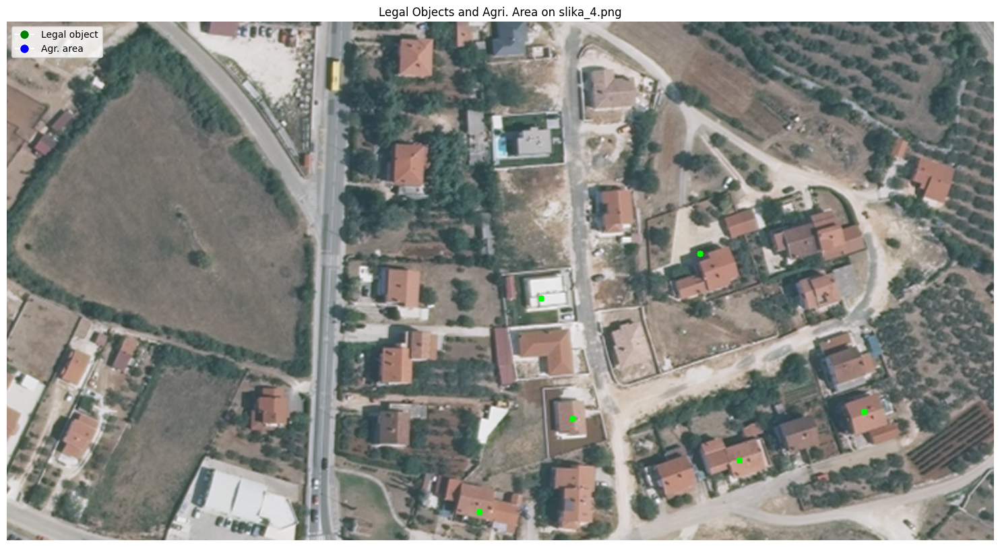

Koordinate slike:
Tx = 291090.45, Ty = 4982965.47
Bx = 291462.66, By = 4982768.15

image 1/1 c:\Users\josip\Documents\GitHub\edih-adria\vodnjan-satelliteguard\sample_images\slika_4.png: 352x640 41 houses, 1 land, 331.0ms
Speed: 2.8ms preprocess, 331.0ms inference, 1.7ms postprocess per image at shape (1, 3, 352, 640)
Detected house 0 matches legal object 5967/7
Detected house 1 does not match any legal object
Detected house 2 does not match any legal object
Detected house 3 does not match any legal object
Detected house 4 does not match any legal object
Detected house 5 does not match any legal object
Detected house 6 does not match any legal object
Detected house 7 does not match any legal object
Detected house 8 matches legal object 5966/3
Detected house 9 does not match any legal object
Detected house 10 matches legal object 5965/3
Detected house 11 does not match any legal object
Detected house 12 does not match any legal object
Detected house 13 does not match any legal object
Det

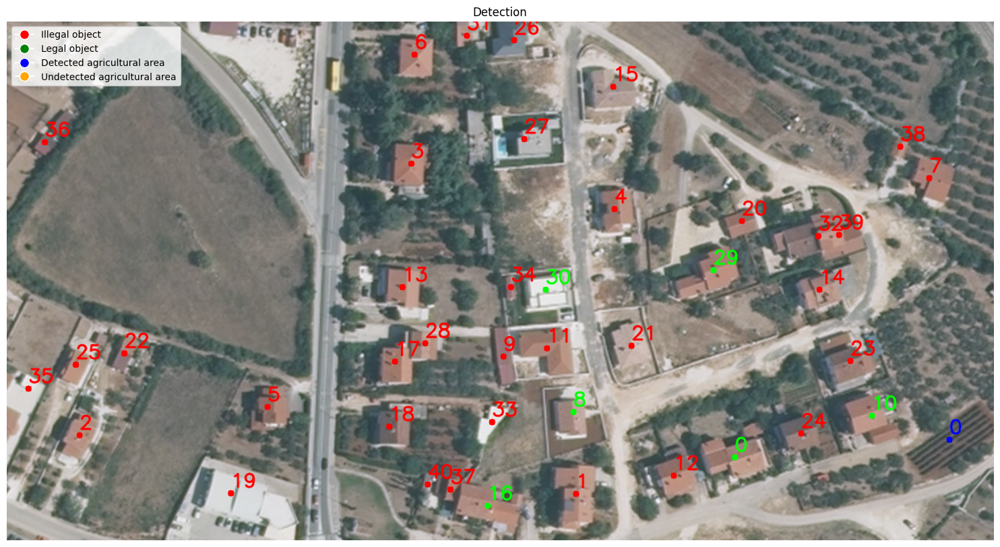

In [26]:
plot_objects_and_agr_area("slika_4.png")
run_detection("slika_4.png")

10 legal objects not on the image slika_5.png
9 agr. area not on the image slika_5.png


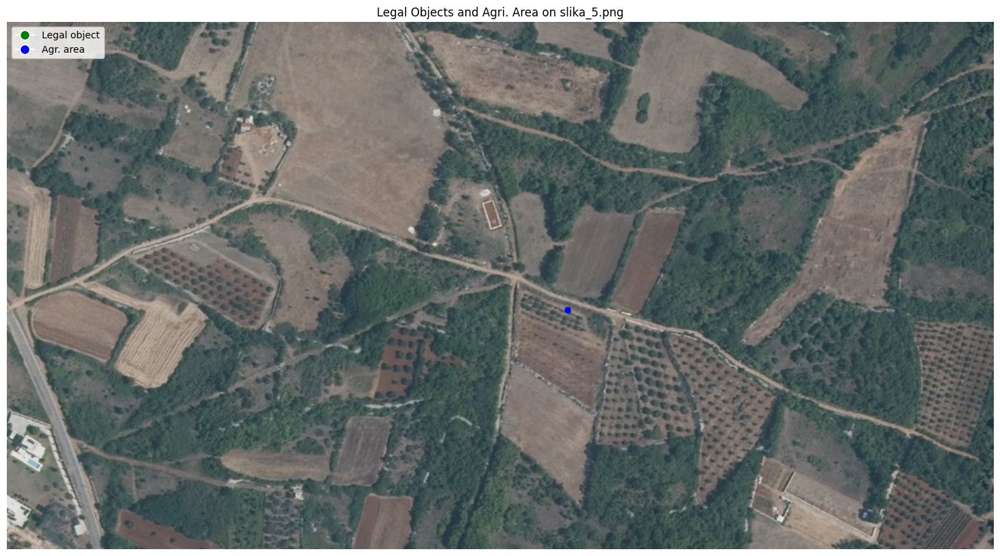

Koordinate slike:
Tx = 291522.6, Ty = 4983069.06
Bx = 292258.44, By = 4982676.33

image 1/1 c:\Users\josip\Documents\GitHub\edih-adria\vodnjan-satelliteguard\sample_images\slika_5.png: 352x640 6 houses, 15 lands, 382.5ms
Speed: 52.4ms preprocess, 382.5ms inference, 2.2ms postprocess per image at shape (1, 3, 352, 640)
Detected agr. area 0 does not match any legal agr. area
Detected agr. area 1 does not match any legal agr. area
Detected agr. area 2 does not match any legal agr. area
Detected agr. area 3 does not match any legal agr. area
Detected agr. area 4 does not match any legal agr. area
Detected agr. area 5 does not match any legal agr. area
Detected house 0 does not match any legal object
Detected agr. area 6 does not match any legal agr. area
Detected agr. area 7 does not match any legal agr. area
Detected agr. area 8 does not match any legal agr. area
Detected house 1 does not match any legal object
Detected house 2 does not match any legal object
Detected agr. area 9 does not

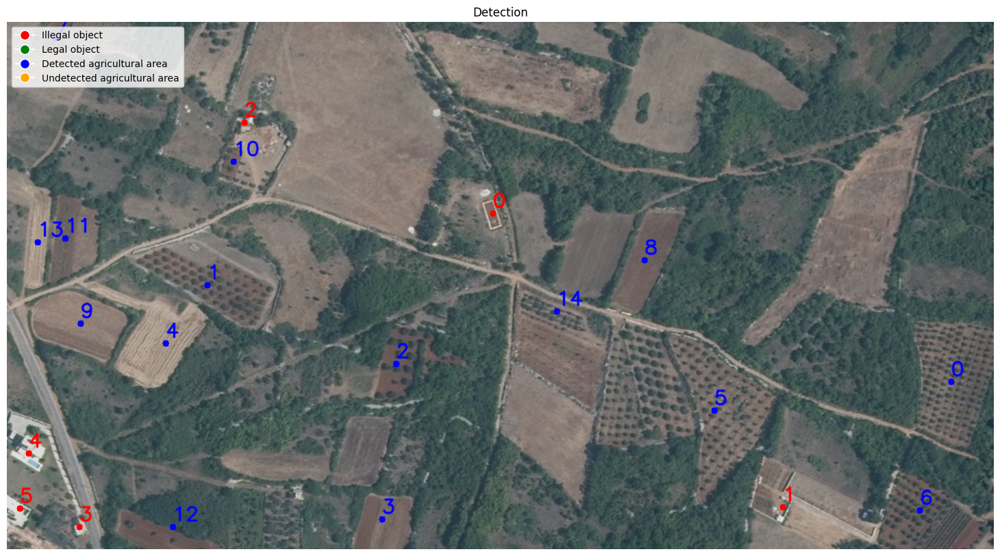

In [27]:
plot_objects_and_agr_area("slika_5.png")
run_detection("slika_5.png")

10 legal objects not on the image slika_6.png
8 agr. area not on the image slika_6.png


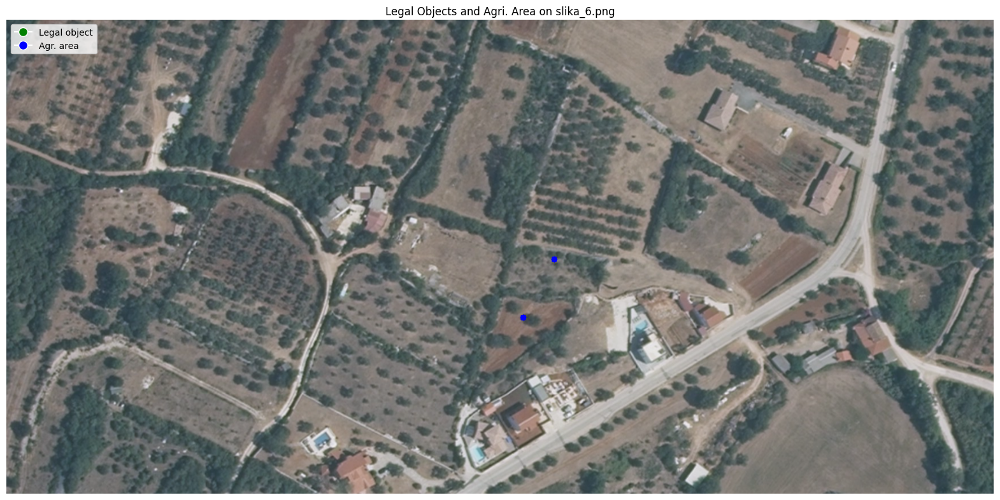

Koordinate slike:
Tx = 291657.04, Ty = 4979647.99
Bx = 292144.08, By = 4979414.76

image 1/1 c:\Users\josip\Documents\GitHub\edih-adria\vodnjan-satelliteguard\sample_images\slika_6.png: 320x640 15 houses, 6 lands, 389.6ms
Speed: 2.8ms preprocess, 389.6ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 640)
Detected agr. area 0 does not match any legal agr. area
Detected house 0 does not match any legal object
Detected house 1 does not match any legal object
Detected house 2 does not match any legal object
Detected house 3 does not match any legal object
Detected house 4 does not match any legal object
Detected house 5 does not match any legal object
Detected house 6 does not match any legal object
Detected house 7 does not match any legal object
Detected agr. area 1 does not match any legal agr. area
Detected house 8 does not match any legal object
Detected house 9 does not match any legal object
Detected agr. area 2 does not match any legal agr. area
Detected house 10 does

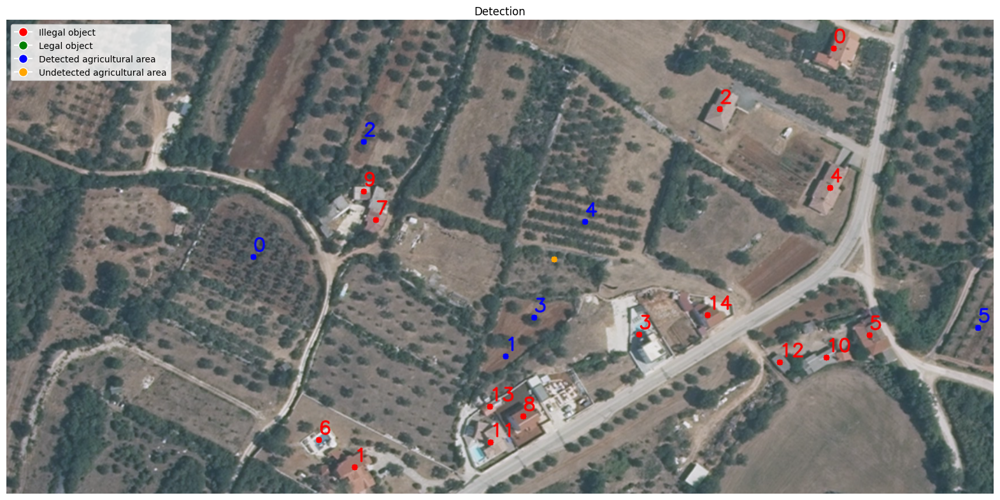

In [29]:
plot_objects_and_agr_area("slika_6.png")
run_detection("slika_6.png")

## Detekcija deponija otpada

In [98]:
import os
from google import genai
from google.genai import types
from dotenv import load_dotenv
from io import BytesIO

load_dotenv()

def detect_dumpsite(image_path):
    im = Image.open(BytesIO(open(image_path, "rb").read()))

    plt.figure(figsize=(8, 8))
    plt.imshow(im)
    plt.axis("off")
    plt.show()

    client = genai.Client(api_key=os.environ["GEMINI_API_KEY"])

    PROMPT = "Does this image contain an illegal dumpsite?"

    response = client.models.generate_content(
        model="gemini-2.0-flash",
        config=types.GenerateContentConfig(
            system_instruction="Return a JSON object with the key 'result' and a boolean value true or false.",
            temperature=0.1,
            response_mime_type="application/json"
        ),
        contents=[PROMPT, im])

    return json.loads(response.text)["result"]

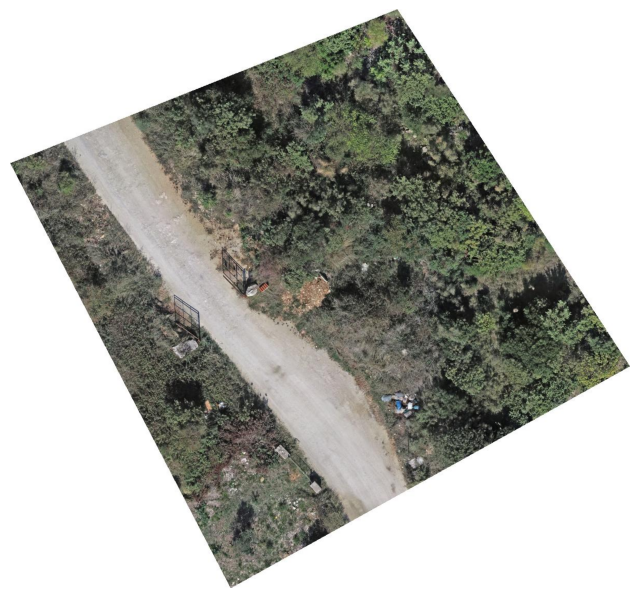

True

In [99]:
detect_dumpsite(os.path.join("sample_images", "vodnjan_kamenolom.jpg"))

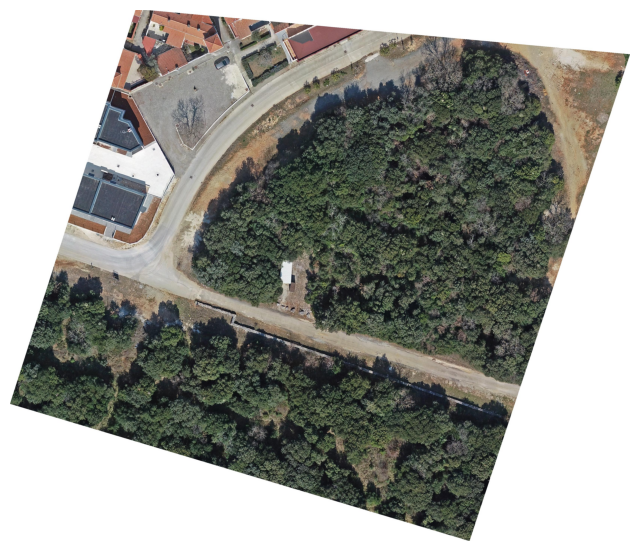

False

In [100]:
detect_dumpsite(os.path.join("sample_images", "barbariga.jpg"))